In [1]:
from sklearn.preprocessing import StandardScaler
from visualization_fct import *
# from bokeh.plotting import output_file, show, save
# ACHTUNG!!! log transform of rateCA or without orbit may be activated

from bokeh.io import output_notebook
output_notebook()
from bokeh.plotting import show  # output_file, save


from pomegranate import HiddenMarkovModel
from pomegranate import MultivariateGaussianDistribution
from pomegranate import State, Distribution

import matplotlib.pyplot as plt  # , mpld3

data = pd.read_csv("../asm_data/asm_data_for_ml.txt", sep='\t')
del data['MJD']
del data['error']
del data['errorA']
del data['errorB']
del data['errorC']
data['rateCA'] = data.rateC / data.rateA
data_thr = mask(data, 'orbit')  # rm too large values except for 'orbit'


np.random.seed(0)

X = np.c_[data_thr.orbit, data_thr.rate, data_thr.rateA, data_thr.rateB,
          data_thr.rateC, data_thr.rateCA]

scaler = StandardScaler()
X = scaler.fit_transform(X)


X_1 = X[2000:3000]
X_11 = X[3000:4000]
X_111 = X[4000:4500]

X_2 = X[400:500]
X_22 = X[500:600]
X_222 = X[600:800]

X_3 = X[7000:7300]
X_33 = X[7300:7600]
X_333 = X[7600:8000]

a = MultivariateGaussianDistribution.from_samples(X_1)
aa = MultivariateGaussianDistribution.from_samples(X_11)
aaa = MultivariateGaussianDistribution.from_samples(X_111)

b = MultivariateGaussianDistribution.from_samples(X_2)
bb = MultivariateGaussianDistribution.from_samples(X_22)
bbb = MultivariateGaussianDistribution.from_samples(X_222)

c = MultivariateGaussianDistribution.from_samples(X_3)
cc = MultivariateGaussianDistribution.from_samples(X_33)
ccc = MultivariateGaussianDistribution.from_samples(X_333)

s1 = State(a, name="M1")
s11 = State(aa, name="M11")
s111 = State(aaa, name="M111")

s2 = State(b, name="M2")
s22 = State(bb, name="M22")
s222 = State(bbb, name="M222")

s3 = State(c, name="M3")
s33 = State(cc, name="M33")
s333 = State(ccc, name="M333")

hmm = HiddenMarkovModel()
hmm.add_states(s1, s11, s111, s2, s22, s222, s3, s33, s333)

hmm.add_transition(hmm.start, s1, 0.12)
hmm.add_transition(hmm.start, s11, 0.11)
hmm.add_transition(hmm.start, s111, 0.11)
hmm.add_transition(hmm.start, s2, 0.11)
hmm.add_transition(hmm.start, s22, 0.11)
hmm.add_transition(hmm.start, s222, 0.11)
hmm.add_transition(hmm.start, s3, 0.11)
hmm.add_transition(hmm.start, s33, 0.11)
hmm.add_transition(hmm.start, s333, 0.11)


hmm.add_transition(s1, s1, 0.92)
hmm.add_transition(s1, s11, 0.01)
hmm.add_transition(s1, s111, 0.01)
hmm.add_transition(s1, s2, 0.01)
hmm.add_transition(s1, s22, 0.01)
hmm.add_transition(s1, s222, 0.01)
hmm.add_transition(s1, s3, 0.01)
hmm.add_transition(s1, s33, 0.01)
hmm.add_transition(s1, s333, 0.01)

hmm.add_transition(s11, s1, 0.01)
hmm.add_transition(s11, s11, 0.92)
hmm.add_transition(s11, s111, 0.01)
hmm.add_transition(s11, s2, 0.01)
hmm.add_transition(s11, s22, 0.01)
hmm.add_transition(s11, s222, 0.01)
hmm.add_transition(s11, s3, 0.01)
hmm.add_transition(s11, s33, 0.01)
hmm.add_transition(s11, s333, 0.01)

hmm.add_transition(s111, s1, 0.01)
hmm.add_transition(s111, s11, 0.01)
hmm.add_transition(s111, s111, 0.92)
hmm.add_transition(s111, s2, 0.01)
hmm.add_transition(s111, s22, 0.01)
hmm.add_transition(s111, s222, 0.01)
hmm.add_transition(s111, s3, 0.01)
hmm.add_transition(s111, s33, 0.01)
hmm.add_transition(s111, s333, 0.01)


hmm.add_transition(s2, s1, 0.01)
hmm.add_transition(s2, s11, 0.01)
hmm.add_transition(s2, s111, 0.01)
hmm.add_transition(s2, s2, 0.92)
hmm.add_transition(s2, s22, 0.01)
hmm.add_transition(s2, s222, 0.01)
hmm.add_transition(s2, s3, 0.01)
hmm.add_transition(s2, s33, 0.01)
hmm.add_transition(s2, s333, 0.01)

hmm.add_transition(s22, s1, 0.01)
hmm.add_transition(s22, s11, 0.01)
hmm.add_transition(s22, s111, 0.01)
hmm.add_transition(s22, s2, 0.01)
hmm.add_transition(s22, s22, 0.92)
hmm.add_transition(s22, s222, 0.01)
hmm.add_transition(s22, s3, 0.01)
hmm.add_transition(s22, s33, 0.01)
hmm.add_transition(s22, s333, 0.01)

hmm.add_transition(s222, s1, 0.01)
hmm.add_transition(s222, s11, 0.01)
hmm.add_transition(s222, s111, 0.01)
hmm.add_transition(s222, s2, 0.01)
hmm.add_transition(s222, s22, 0.01)
hmm.add_transition(s222, s222, 0.92)
hmm.add_transition(s222, s3, 0.01)
hmm.add_transition(s222, s33, 0.01)
hmm.add_transition(s222, s333, 0.01)


hmm.add_transition(s3, s1, 0.01)
hmm.add_transition(s3, s11, 0.01)
hmm.add_transition(s3, s111, 0.01)
hmm.add_transition(s3, s2, 0.01)
hmm.add_transition(s3, s22, 0.01)
hmm.add_transition(s3, s222, 0.01)
hmm.add_transition(s3, s3, 0.92)
hmm.add_transition(s3, s33, 0.01)
hmm.add_transition(s3, s333, 0.01)

hmm.add_transition(s33, s1, 0.01)
hmm.add_transition(s33, s11, 0.01)
hmm.add_transition(s33, s111, 0.01)
hmm.add_transition(s33, s2, 0.01)
hmm.add_transition(s33, s22, 0.01)
hmm.add_transition(s33, s222, 0.01)
hmm.add_transition(s33, s3, 0.01)
hmm.add_transition(s33, s33, 0.92)
hmm.add_transition(s33, s333, 0.01)

hmm.add_transition(s333, s1, 0.01)
hmm.add_transition(s333, s11, 0.01)
hmm.add_transition(s333, s111, 0.01)
hmm.add_transition(s333, s2, 0.01)
hmm.add_transition(s333, s22, 0.01)
hmm.add_transition(s333, s222, 0.01)
hmm.add_transition(s333, s3, 0.01)
hmm.add_transition(s333, s33, 0.01)
hmm.add_transition(s333, s333, 0.92)

hmm.bake()

Loading BokehJS ...

In [2]:
hmm.fit(X)  # hmm does not support weights in pomegranate
preds = hmm.predict(X)
probs = hmm.predict_proba(X)

data_thr['preds'] = pd.Series(preds).astype("category")

color_key = ["red", "blue", "yellow", "grey", "black", "purple", "pink",
             "brown", "green", "orange"]  # Spectral9
color_key = color_key[:len(set(preds))+2]

covs = np.array([np.array(hmm.states[m].distribution.parameters[1])
                 for m in range(9)])
means = np.array([np.array(hmm.states[m].distribution.parameters[0])
                  for m in range(9)])

# transform cov for non-standardizeed data:
covs = np.array([np.dot(np.diag(np.sqrt(scaler.var_)),
                        np.dot(covs[j], np.diag(np.sqrt(scaler.var_))))
                 for j in range(covs.shape[0])])
means = np.array([scaler.inverse_transform(means[j].reshape(1, -1)).T
                  for j in range(means.shape[0])])

Training improvement: 1400113.14723
Training improvement: 235441.878804
Training improvement: 125124.961282
Training improvement: 71923.42193
Training improvement: 34620.1215655
Training improvement: -1384792.79623
Total Training Improvement: 482430.734584


In [3]:
# single plot rateCA vs rate with predicted classes and ellipses:
x = 5
y = 1
covs_xy = [covs[j][[x, y]][:, [x, y]] for j in range(len(covs))]
means_xy = [means[j][[x, y]] for j in range(len(covs))]

# # #uncommment if log
#for j in range(len(covs)):
#    covs_xy[j][0] = np.exp(covs_xy[j][0]) - 1
#    means_xy[j][0] = np.exp(means_xy[j][0]) - 1

single_plot = bokeh_datashader_plot(data_thr, covs=covs_xy, means=means_xy,
                                    x_name='rateCA',
                                    y_name='rate',
                                    plot_width=900, plot_height=300,
                                    pixel_width=3000, pixel_height=1000,
                                    spread=True, color_key=color_key)
show(single_plot)

In [50]:
# linked brushing:

x = 5
y = 1
covs_xy = [covs[j][[x, y]][:, [x, y]] for j in range(len(covs))]
means_xy = [means[j][[x, y]] for j in range(len(covs))]


data_probs = data_thr.copy()
for j in range(probs.shape[1]):
    data_probs['probs'+str(j)] = pd.Series(probs[:, j])

p = plot_probs_bokeh_linked_brushing(data_probs, color_key=color_key,
                                x_name='rateCA', y_name='rate',
                                covs=covs_xy, means=means_xy)
show(p)

9378


In [46]:
T = np.exp(hmm.dense_transition_matrix())[:9, :9]

In [47]:
#["red", "blue", "yellow", "grey", "black", "purple", "pink", "brown", "green", "orange"]

array([  9.03848708e-01,   5.19379600e-02,   4.26682432e-02,
         1.94878939e-04,   7.67139483e-09,   9.77025373e-04,
         3.69374072e-04,   1.98822712e-09,   3.80072864e-06])

<IPython.core.display.Javascript object>


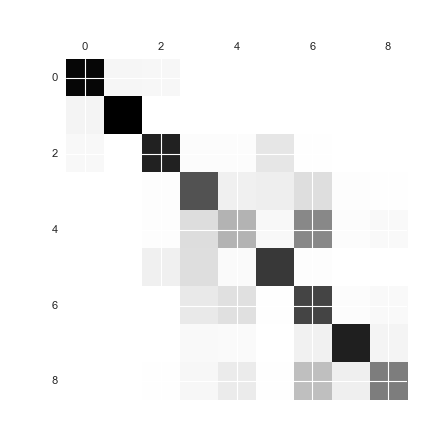

In [48]:
%matplotlib notebook
plt.matshow(np.log(T+1))

In [30]:
T[9]

array([-2.66885341, -2.8345602 , -2.52846245, -1.61539919, -2.32702186,
       -2.11950322, -1.25226734, -2.84906805, -3.44515901,        -inf,
              -inf])

In [31]:
hmm.states[9]

{
    "distribution" : null,
    "class" : "State",
    "weight" : 1.0,
    "name" : "None-start"
}